# Ecliptic Strip Figures — Paper

Reproduces the ecliptic-strip plots (β, v_λ, v_β vs λ) and heliocentric X-Y plots
using the refactored `velocity_density_pipeline.py` (conditional K|M cloner, no angular sky cut).

Cloning uses `clone_population_conditional_K_from_M` (preserves empirical M distribution
and conditional K|M correlation). Propagation is chunked and the |β| strip filter is applied
per chunk, so only ~5% of each chunk accumulates.

## 0. Imports

In [4]:
import sys
sys.path.insert(0, "../../src")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from astropy.time import Time as AstropyTime

import neoscore as nsc
import velocity_density_pipeline as vdp

mpl.rcParams.update({
    "font.size": 12,
    "axes.labelsize": 13,
    "axes.titlesize": 12,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "figure.dpi": 150,
})

## 1. Settings

In [5]:
OBSTIME_STR  = "2025-03-21T00:00:00"
BETA_MAX_DEG = 3.0

# Clone factors 
CLONE_FACTORS = {"MBA": 1, "NEO": 10, "TNO": 10, "Trojans": 1}

## 2. Load populations

In [6]:
print("Loading MBA...")
df_mba, scorer_mba = vdp.load_s3m_population("mba", verbose=True)

print("\nLoading NEO...")
df_neo, scorer_neo = vdp.load_s3m_population("neo", verbose=True)

print("\nLoading TNO...")
df_tno, scorer_tno = vdp.load_s3m_population("tno", verbose=True)

print("\nLoading Trojans...")
df_trojan, scorer_trojan = vdp.load_s3m_population("trojan", verbose=True)

Loading MBA...
Search pattern: S1_*.s3m
Search dirs: ['.', 'S3Mdata']
Matched files: ['S3Mdata/S1_00.s3m', 'S3Mdata/S1_01.s3m', 'S3Mdata/S1_02.s3m', 'S3Mdata/S1_03.s3m', 'S3Mdata/S1_04.s3m', 'S3Mdata/S1_05.s3m', 'S3Mdata/S1_06.s3m', 'S3Mdata/S1_07.s3m', 'S3Mdata/S1_08.s3m', 'S3Mdata/S1_09.s3m', 'S3Mdata/S1_10.s3m', 'S3Mdata/S1_11.s3m', 'S3Mdata/S1_12.s3m', 'S3Mdata/S1_13.s3m']
Loaded 14 file(s).
Final dataframe shape: (13883361, 15)
The final df is done.

Loading NEO...
Search pattern: S0.s3m
Search dirs: ['.', 'S3Mdata']
Matched files: ['S3Mdata/S0.s3m']
Loaded 1 file(s).
Final dataframe shape: (268511, 15)
The final df is done.

Loading TNO...
Search pattern: ST.s3m
Search dirs: ['.', 'S3Mdata']
Matched files: ['S3Mdata/ST.s3m']
Loaded 1 file(s).
Final dataframe shape: (48682, 15)
The final df is done.

Loading Trojans...
Search pattern: St5.s3m
Search dirs: ['.', 'S3Mdata']
Matched files: ['S3Mdata/St5.s3m']
Loaded 1 file(s).
Final dataframe shape: (179882, 15)
The final df is done.

## 3. Ecliptic strip data builder

- `max_objects`: subsample the raw df before cloning (needed for MBA at ~13.8M, and NEO at 268k × clone_factor=10).
- `object_chunk`: propagate this many clones at a time; the |β| filter is applied per chunk
  so only ~5% of each chunk accumulates.

In [7]:
def build_ecliptic_strip_data(
    df,
    scorer,
    clone_factor,
    obstime_str,
    beta_max_deg=3.0,
    max_objects=None,
    object_chunk=50_000,
    rng=None,
):
    """Conditional K|M clone -> chunked full-sky propagation -> beta strip filter.
    Returns dict: lam_deg, beta_deg, vlam, vbeta, x_helio_au, y_helio_au."""
    if rng is None:
        rng = np.random.default_rng(42)

    if max_objects is not None and len(df) > max_objects:
        idx = rng.choice(len(df), size=max_objects, replace=False)
        df = df.iloc[idx].reset_index(drop=True)
        print(f"  subsampled df to {len(df)} objects")

    a_rep, e_rep, inc_rep, raan_rep, argp_rep, tp_out = vdp.clone_population_conditional_K_from_M(
        df=df, clone_factor=clone_factor, obstime_str=obstime_str, rng=rng,
    )
    raw_clone_df = pd.DataFrame({
        "a": a_rep.astype("float64"), "e": e_rep.astype("float64"),
        "i": inc_rep.astype("float64"), "node": raan_rep.astype("float64"),
        "argperi": argp_rep.astype("float64"), "t_p": tp_out.astype("float64"),
    })
    n_clones = len(raw_clone_df)
    n_chunks = int(np.ceil(n_clones / object_chunk))
    print(f"  cloned: {n_clones} objects -> {n_chunks} chunks of {object_chunk}")

    strip_chunks = []
    for i, start in enumerate(range(0, n_clones, object_chunk)):
        chunk_df = raw_clone_df.iloc[start : start + object_chunk]
        print(f"  chunk {i+1}/{n_chunks} ({len(chunk_df)} objects)...", end=" ", flush=True)
        vis = vdp.build_visible_subset_dataframe(
            chunk_df, obstime_str=obstime_str, scorer=scorer,
            max_sep_deg=180.0, center_mode="custom_ecliptic",
            center_lon_deg=0.0, center_lat_deg=0.0, show_progress=False,
        )
        m = np.abs(vis["beta_deg"].to_numpy()) < beta_max_deg
        strip_chunks.append(vis[m])
        print(f"{m.sum()} kept")

    strip_df = pd.concat(strip_chunks, ignore_index=True)
    print(f"  total in strip |beta|<{beta_max_deg}deg: {len(strip_df)}")

    r_ecl, _ = nsc.elements_to_helio_ecliptic_state(
        a_AU=strip_df["a"].to_numpy(float), e=strip_df["e"].to_numpy(float),
        inc_deg=strip_df["i"].to_numpy(float), raan_deg=strip_df["node"].to_numpy(float),
        argp_deg=strip_df["argperi"].to_numpy(float), tp_mjd=strip_df["t_p"].to_numpy(float),
        obstime_str=obstime_str, method="newton", n_iter=10, show_progress=False,
    )
    scale = vdp.AU_KM if np.nanmedian(np.linalg.norm(r_ecl, axis=1)) > 1000 else 1.0

    return {
        "lam_deg": strip_df["lam_deg"].to_numpy(), "beta_deg": strip_df["beta_deg"].to_numpy(),
        "vlam": strip_df["vlam"].to_numpy(), "vbeta": strip_df["vbeta"].to_numpy(),
        "x_helio_au": r_ecl[:, 0] / scale, "y_helio_au": r_ecl[:, 1] / scale,
    }

## 4. Build ecliptic strip data for each population

Expected runtime (approximate)(unless you're on a mac, its faster then): 
- MBA: ~2–4 min (subsampled to 300k before cloning)
- NEO: ~3–5 min (subsampled to 50k × clone_factor 10 = 500k clones)
- TNO: ~2–4 min (48k × 10 = 480k clones, 10 chunks)
- Trojans: ~1–2 min (179k × 1 = 179k clones, 4 chunks)

In [96]:
print("=== MBA ===")
ecliptic_mba = build_ecliptic_strip_data(
    df=df_mba, scorer=scorer_mba, clone_factor=CLONE_FACTORS["MBA"],
    obstime_str=OBSTIME_STR, beta_max_deg=BETA_MAX_DEG,
    max_objects=300_000, object_chunk=50_000, rng=np.random.default_rng(501),
)

=== MBA ===
  subsampled df to 300000 objects
  cloned: 300000 objects -> 6 chunks of 50000
  chunk 1/6 (50000 objects)... 16240 kept
  chunk 2/6 (50000 objects)... 16384 kept
  chunk 3/6 (50000 objects)... 16404 kept
  chunk 4/6 (50000 objects)... 16290 kept
  chunk 5/6 (50000 objects)... 16203 kept
  chunk 6/6 (50000 objects)... 16320 kept
  total in strip |beta|<3.0deg: 97841


In [97]:
print("=== NEO ===")
ecliptic_neo = build_ecliptic_strip_data(
    df=df_neo, scorer=scorer_neo, clone_factor=CLONE_FACTORS["NEO"],
    obstime_str=OBSTIME_STR, beta_max_deg=BETA_MAX_DEG,
    max_objects=50_000, object_chunk=50_000, rng=np.random.default_rng(502),
)

=== NEO ===
  subsampled df to 50000 objects
  cloned: 500000 objects -> 10 chunks of 50000
  chunk 1/10 (50000 objects)... 9265 kept
  chunk 2/10 (50000 objects)... 9266 kept
  chunk 3/10 (50000 objects)... 9253 kept
  chunk 4/10 (50000 objects)... 9514 kept
  chunk 5/10 (50000 objects)... 8909 kept
  chunk 6/10 (50000 objects)... 9365 kept
  chunk 7/10 (50000 objects)... 9370 kept
  chunk 8/10 (50000 objects)... 9084 kept
  chunk 9/10 (50000 objects)... 9093 kept
  chunk 10/10 (50000 objects)... 9195 kept
  total in strip |beta|<3.0deg: 92314


In [98]:
print("=== TNO ===")
ecliptic_tno = build_ecliptic_strip_data(
    df=df_tno, scorer=scorer_tno, clone_factor=CLONE_FACTORS["TNO"],
    obstime_str=OBSTIME_STR, beta_max_deg=BETA_MAX_DEG,
    object_chunk=50_000, rng=np.random.default_rng(503),
)

=== TNO ===
  cloned: 486820 objects -> 10 chunks of 50000
  chunk 1/10 (50000 objects)... 26390 kept
  chunk 2/10 (50000 objects)... 26300 kept
  chunk 3/10 (50000 objects)... 26519 kept
  chunk 4/10 (50000 objects)... 26316 kept
  chunk 5/10 (50000 objects)... 26156 kept
  chunk 6/10 (50000 objects)... 25985 kept
  chunk 7/10 (50000 objects)... 25917 kept
  chunk 8/10 (50000 objects)... 26027 kept
  chunk 9/10 (50000 objects)... 24693 kept
  chunk 10/10 (36820 objects)... 16493 kept
  total in strip |beta|<3.0deg: 250796


In [99]:
print("=== Trojans ===")
ecliptic_trojan = build_ecliptic_strip_data(
    df=df_trojan, scorer=scorer_trojan, clone_factor=CLONE_FACTORS["Trojans"],
    obstime_str=OBSTIME_STR, beta_max_deg=BETA_MAX_DEG,
    object_chunk=50_000, rng=np.random.default_rng(504),
)

=== Trojans ===
  cloned: 179882 objects -> 4 chunks of 50000
  chunk 1/4 (50000 objects)... 10353 kept
  chunk 2/4 (50000 objects)... 10447 kept
  chunk 3/4 (50000 objects)... 10295 kept
  chunk 4/4 (29882 objects)... 6278 kept
  total in strip |beta|<3.0deg: 37373


In [100]:
ecliptic_data = {
    "MBA": ecliptic_mba, "NEO": ecliptic_neo,
    "TNO": ecliptic_tno, "Trojans": ecliptic_trojan,
}

## 5. Ecliptic strip plotter (β, v_λ, v_β vs λ)

In [1]:
STYLE = {
    "MBA":     {"alpha": 0.22, "s": 1, "color": "orange"},
    "NEO":     {"alpha": 0.08, "s": 1, "color": "blue"},
    "TNO":     {"alpha": 0.18, "s": 1, "color": "green"},
    "Trojans": {"alpha": 0.18, "s": 1, "color": "purple"},
}

POP_LABEL = {
    "MBA": "MBA",
    "NEO": "NEO",
    "TNO": "TNO",
    "Trojans": "Jupiter Trojans",
}


def _save_figure(fig, save_path, dpi=200):
    if save_path is None:
        return
    if isinstance(save_path, (str, Path)):
        save_paths = [save_path]
    else:
        save_paths = save_path
    for out in save_paths:
        fig.savefig(out, bbox_inches="tight", dpi=dpi)


def _prepare_strip_data(population_data, populations, lam_window, max_points, seed):
    rng = np.random.default_rng(seed)
    prepared = {}
    for pop in populations:
        d = population_data[pop]
        lam = np.mod(d["lam_deg"], 360.0)
        beta, vlam, vbeta = d["beta_deg"], d["vlam"], d["vbeta"]
        lam_lo, lam_hi = lam_window
        m = (lam >= lam_lo) & (lam <= lam_hi) if lam_lo <= lam_hi else (lam >= lam_lo) | (lam <= lam_hi)
        lam, beta, vlam, vbeta = lam[m], beta[m], vlam[m], vbeta[m]
        nmax = max_points.get(pop, len(lam))
        if len(lam) > nmax:
            idx = rng.choice(len(lam), size=nmax, replace=False)
            lam, beta, vlam, vbeta = lam[idx], beta[idx], vlam[idx], vbeta[idx]
        prepared[pop] = {"lam": lam, "beta": beta, "vlam": vlam, "vbeta": vbeta}
        print(f"{pop} in window: {len(lam)}")
    return prepared


def plot_eclipticstrip_populations(
    population_data, populations=None, beta_max_deg=3.0,
    lam_window=(0.0, 360.0), beta_ylim=(-3.2, 3.2),
    vlam_ylim=(-0.8, 0.8), vbeta_ylim=(-0.3, 0.3),
    max_points=None, seed=123, title=None, save_path=None,
    figsize=(7.2, 6.4), dpi=200,
):
    if populations is None:
        populations = list(population_data.keys())
    if max_points is None:
        max_points = {pop: 100_000 for pop in populations}

    prepared = _prepare_strip_data(population_data, populations, lam_window, max_points, seed)

    fig, (ax1, ax2, ax3) = plt.subplots(
        3, 1, figsize=figsize, sharex=True,
        gridspec_kw=dict(height_ratios=[0.85, 1.0, 1.0], hspace=0.08),
    )
    for pop in populations:
        st = STYLE.get(pop, {"alpha": 0.18, "s": 1, "color": "gray"})
        d = prepared[pop]
        label = POP_LABEL.get(pop, pop)
        ax1.scatter(d["lam"], d["beta"],  s=st["s"], alpha=st["alpha"], color=st["color"], label=label, rasterized=True)
        ax2.scatter(d["lam"], d["vlam"],  s=st["s"], alpha=st["alpha"], color=st["color"], rasterized=True)
        ax3.scatter(d["lam"], d["vbeta"], s=st["s"], alpha=st["alpha"], color=st["color"], rasterized=True)
    for ax in (ax1, ax2, ax3):
        ax.axhline(0, lw=0.8, color="0.35")
        ax.tick_params(labelsize=8)
    ax1.set_ylabel(r"$\beta$ (deg)", fontsize=9); ax1.set_ylim(*beta_ylim); ax1.legend(loc="upper right", fontsize=8, frameon=True)
    ax2.set_ylabel(r"$v_\lambda$ (deg/day)", fontsize=9); ax2.set_ylim(*vlam_ylim)
    ax3.set_ylabel(r"$v_\beta$ (deg/day)", fontsize=9); ax3.set_xlabel(r"$\lambda$ (deg)", fontsize=9); ax3.set_ylim(*vbeta_ylim)
    ax3.set_xlim(360, 0) if lam_window in ((0.0, 360.0), (0, 360)) else ax3.set_xlim(lam_window[1], lam_window[0])
    if title:
        fig.suptitle(title + f"\nwith |beta| < {beta_max_deg}°", fontsize=10)
    _save_figure(fig, save_path, dpi=dpi)
    plt.show()


def plot_eclipticstrip_population_grid(
    population_data, populations, beta_max_deg=3.0,
    lam_window=(0.0, 360.0), beta_ylim=(-3.2, 3.2),
    vlam_ylim=(-0.8, 0.8), vbeta_ylim=(-0.3, 0.3),
    max_points=None, seed=123, title=None, save_path=None,
    figsize=(10.0, 6.4), dpi=200,
):
    if max_points is None:
        max_points = {pop: 100_000 for pop in populations}
    prepared = _prepare_strip_data(population_data, populations, lam_window, max_points, seed)

    fig, axes = plt.subplots(
        3, len(populations), figsize=figsize, sharex=True,
        gridspec_kw=dict(height_ratios=[0.85, 1.0, 1.0], hspace=0.08, wspace=0.14),
    )
    axes = np.atleast_2d(axes)
    row_specs = [
        ("beta", r"$\beta$ (deg)", beta_ylim),
        ("vlam", r"$v_\lambda$ (deg/day)", vlam_ylim),
        ("vbeta", r"$v_\beta$ (deg/day)", vbeta_ylim),
    ]
    for col, pop in enumerate(populations):
        st = STYLE.get(pop, {"alpha": 0.18, "s": 1, "color": "gray"})
        d = prepared[pop]
        axes[0, col].set_title(POP_LABEL.get(pop, pop), fontsize=10)
        for row, (key, ylabel, ylim) in enumerate(row_specs):
            ax = axes[row, col]
            ax.scatter(d["lam"], d[key], s=st["s"], alpha=st["alpha"], color=st["color"], rasterized=True)
            ax.axhline(0, lw=0.8, color="0.35")
            ax.set_ylim(*ylim)
            ax.tick_params(labelsize=8)
            if col == 0:
                ax.set_ylabel(ylabel, fontsize=9)
            if row == 2:
                ax.set_xlabel(r"$\lambda$ (deg)", fontsize=9)
            ax.set_xlim(360, 0) if lam_window in ((0.0, 360.0), (0, 360)) else ax.set_xlim(lam_window[1], lam_window[0])
    if title:
        fig.suptitle(title + f"; |beta| < {beta_max_deg}°", fontsize=10)
    _save_figure(fig, save_path, dpi=dpi)
    plt.show()


## 6. Ecliptic strip figures

In [2]:
plot_eclipticstrip_populations(
    population_data=ecliptic_data, populations=["MBA", "NEO"], beta_max_deg=2.5,
    lam_window=(0.0, 360.0), beta_ylim=(-3.2, 3.2), vlam_ylim=(-0.8, 0.8), vbeta_ylim=(-0.3, 0.3),
    max_points={"MBA": 150_000, "NEO": 50_000}, seed=503,
    title=None,
    save_path=["ecliptic_strip_MBA_NEO.pdf", "ecliptic_strip_MBA_NEO.png"],
)


NameError: name 'ecliptic_data' is not defined

In [3]:
plot_eclipticstrip_population_grid(
    population_data=ecliptic_data, populations=["Trojans", "TNO"], beta_max_deg=2.5,
    lam_window=(0.0, 360.0), beta_ylim=(-3.2, 3.2), vlam_ylim=(-0.8, 0.8), vbeta_ylim=(-0.3, 0.3),
    max_points={"Trojans": 100_000, "TNO": 100_000}, seed=503,
    title=None,
    save_path=["ecliptic_strip_Trojans_TNO.pdf", "ecliptic_strip_Trojans_TNO.png"],
)


NameError: name 'ecliptic_data' is not defined

In [ ]:
# Optional: keep these commented-out calls if you need standalone Trojan or TNO panels later.
# plot_eclipticstrip_populations(
#     population_data=ecliptic_data, populations=["Trojans"], beta_max_deg=2.5,
#     lam_window=(0.0, 360.0), beta_ylim=(-3.2, 3.2), vlam_ylim=(-0.8, 0.8), vbeta_ylim=(-0.3, 0.3),
#     max_points={"Trojans": 100_000}, seed=503,
#     title=None,
#     save_path=["ecliptic_strip_Trojans.pdf", "ecliptic_strip_Trojans.png"],
# )
# plot_eclipticstrip_populations(
#     population_data=ecliptic_data, populations=["TNO"], beta_max_deg=2.5,
#     lam_window=(0.0, 360.0), beta_ylim=(-3.2, 3.2), vlam_ylim=(-0.8, 0.8), vbeta_ylim=(-0.3, 0.3),
#     max_points={"TNO": 100_000}, seed=503,
#     title=None,
#     save_path=["ecliptic_strip_TNO.pdf", "ecliptic_strip_TNO.png"],
# )


## 7. Heliocentric X-Y plotter (per population)

In [105]:
def plot_heliocentric_xy(
    population_data, population, label=None,
    lam_bins=np.arange(0, 361, 10), xy_max_au=8.0,
    max_xy_points=100_000, seed=123, save_path=None,
):
    rng  = np.random.default_rng(seed)
    data = population_data[population]
    if label is None:
        label = population
    lam = np.mod(data["lam_deg"], 360.0)
    xh, yh = data["x_helio_au"], data["y_helio_au"]
    if len(xh) > max_xy_points:
        idx = rng.choice(len(xh), size=max_xy_points, replace=False)
        xh, yh = xh[idx], yh[idx]
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5), gridspec_kw=dict(wspace=0.28))
    ax1.hist(lam, bins=lam_bins)
    ax1.set_xlabel(r"$\lambda$ (deg)"); ax1.set_ylabel("Count")
    ax1.set_title(f"{label}: longitude histogram"); ax1.set_xlim(0, 360)
    ax2.scatter(xh, yh, s=2, alpha=0.35)
    ax2.scatter([0], [0], s=80, marker="o", color="orange", zorder=5)
    ax2.axhline(0, lw=1); ax2.axvline(0, lw=1)
    ax2.set_xlabel("Heliocentric X (AU)"); ax2.set_ylabel("Heliocentric Y (AU)")
    ax2.set_title(f"{label}: heliocentric ecliptic X-Y")
    ax2.set_aspect("equal", adjustable="box")
    ax2.set_xlim(-xy_max_au, xy_max_au); ax2.set_ylim(-xy_max_au, xy_max_au)
    if save_path:
        plt.savefig(save_path, bbox_inches="tight")
    plt.show()

## 8. Heliocentric X-Y figures (per population)

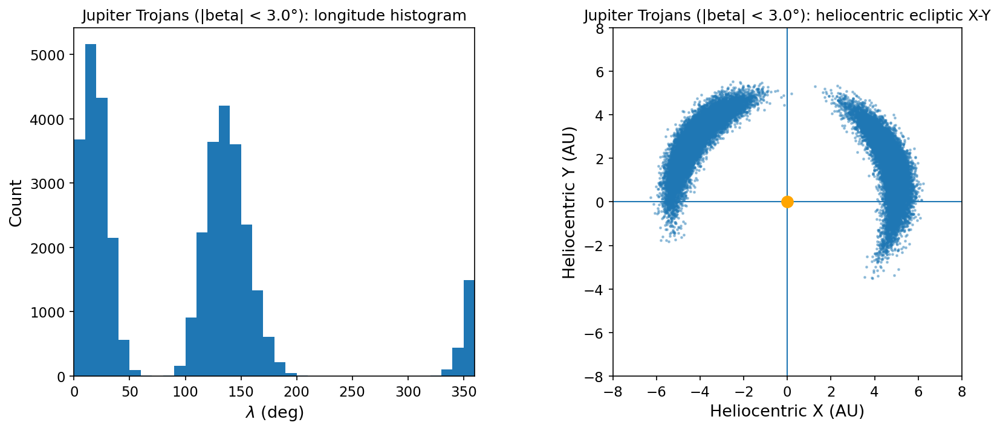

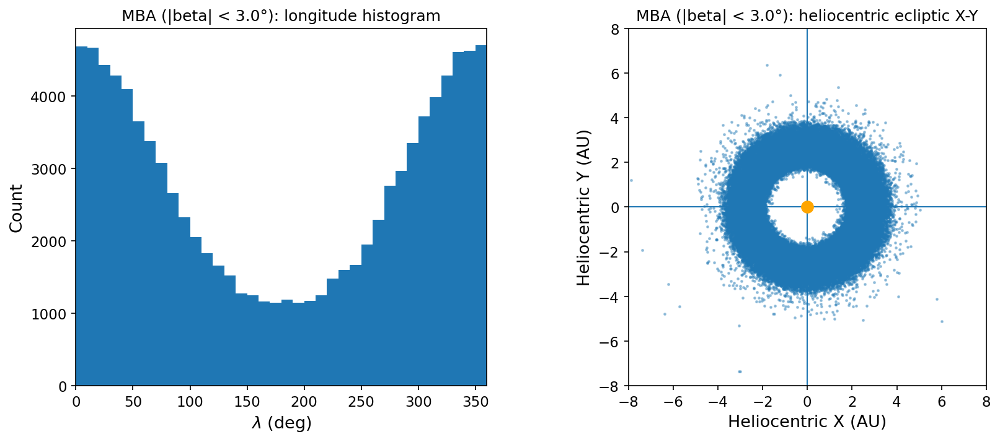

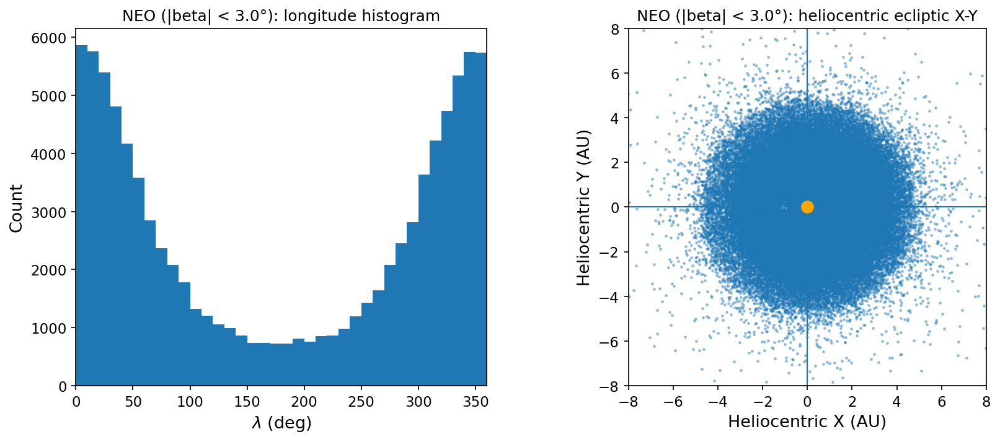

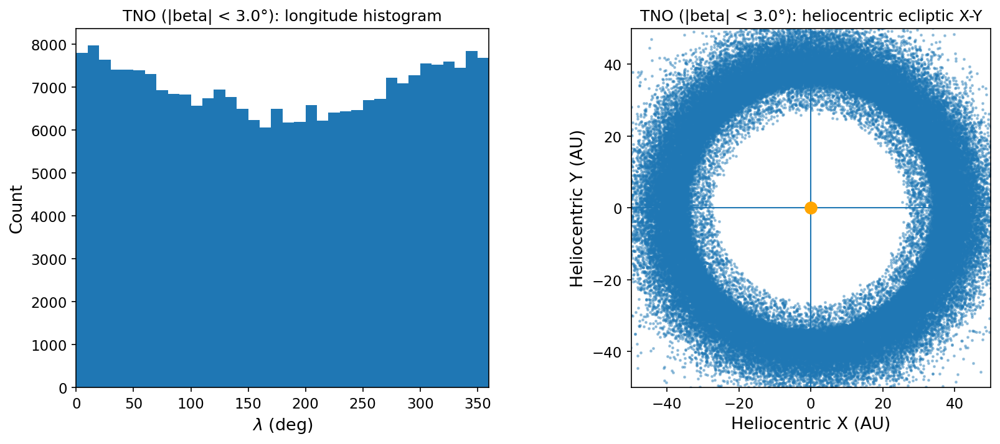

In [106]:
plot_heliocentric_xy(ecliptic_data, "Trojans",
    label=f"Jupiter Trojans (|beta| < {BETA_MAX_DEG}\u00b0)",
    xy_max_au=8.0, max_xy_points=100_000, seed=702, save_path="helio_xy_Trojans.pdf")

plot_heliocentric_xy(ecliptic_data, "MBA",
    label=f"MBA (|beta| < {BETA_MAX_DEG}\u00b0)",
    xy_max_au=8.0, max_xy_points=100_000, seed=721, save_path="helio_xy_MBA.pdf")

plot_heliocentric_xy(ecliptic_data, "NEO",
    label=f"NEO (|beta| < {BETA_MAX_DEG}\u00b0)",
    xy_max_au=8.0, max_xy_points=100_000, seed=722, save_path="helio_xy_NEO.pdf")

plot_heliocentric_xy(ecliptic_data, "TNO",
    label=f"TNO (|beta| < {BETA_MAX_DEG}\u00b0)",
    xy_max_au=50.0, max_xy_points=100_000, seed=722, save_path="helio_xy_TNO.pdf")

---
## 9. Cloning validation — orbital element distributions

Two figures explaining and validating the conditional K|M cloner:

1. **Mean anomaly M distribution** (all 4 populations): raw S3M vs K|M cloned.  
   Shows the cloner reproduces the empirical M distribution (not forcing uniform).

2. **Trojan L4/L5 preservation**: ecliptic mean longitude for raw S3M, uniform-M clone
   (old approach), and conditional K|M clone (new approach).  
   Shows why uniform-M cloning fails and why the new approach is needed.

Mean longitude is approximated as L = M + Ω + ω (exact for circular orbits, a good sub for the true ecliptic longitude for the low-eccentricity populations plotted here).

In [107]:
def _mean_longitude(a_AU, tp_mjd, node_deg, argperi_deg, obstime_str):
    """Approximate mean longitude L = M + Omega + omega (degrees, mod 360)."""
    t_obs  = AstropyTime(obstime_str, scale="tdb").mjd
    P_days = 365.25 * np.asarray(a_AU, float) ** 1.5
    n      = 360.0 / P_days
    M      = np.mod(n * (t_obs - np.asarray(tp_mjd, float)), 360.0)
    L      = np.mod(M + np.asarray(node_deg, float) + np.asarray(argperi_deg, float), 360.0)
    return M, L


def build_cloning_comparison(df, clone_factor, obstime_str, max_objects=None, rng=None):
    """
    For a population df, return M and mean longitude L for:
      - raw S3M
      - conditional K|M clone  (new approach)
      - uniform M clone         (old approach, for contrast)
    """
    if rng is None:
        rng = np.random.default_rng(42)
    if max_objects and len(df) > max_objects:
        idx = rng.choice(len(df), size=max_objects, replace=False)
        df  = df.iloc[idx].reset_index(drop=True)

    # --- raw S3M ---
    M_raw, L_raw = _mean_longitude(
        df["a"], df["t_p"], df["node"], df["argperi"], obstime_str
    )

    # --- conditional K|M clone ---
    a_c, _, _, node_c, argp_c, tp_c = vdp.clone_population_conditional_K_from_M(
        df=df, clone_factor=clone_factor, obstime_str=obstime_str, rng=rng,
    )
    M_km, L_km = _mean_longitude(a_c, tp_c, node_c, argp_c, obstime_str)

    # --- uniform-M clone (old approach) ---
    rng_u     = np.random.default_rng(777)
    N_u       = len(df) * clone_factor
    node_u    = np.repeat(df["node"].to_numpy(float),    clone_factor)
    argperi_u = np.repeat(df["argperi"].to_numpy(float), clone_factor)
    M_uni     = rng_u.uniform(0.0, 360.0, N_u)
    L_uni     = np.mod(M_uni + node_u + argperi_u, 360.0)

    return {
        "raw":     {"M": M_raw, "L": L_raw},
        "km":      {"M": M_km,  "L": L_km},
        "uniform": {"M": M_uni, "L": L_uni},
    }

In [108]:
# Build comparison data only cloning step, no orbital propagation needed
print("MBA...")
comp_mba     = build_cloning_comparison(df_mba,    CLONE_FACTORS["MBA"],
                   OBSTIME_STR, max_objects=50_000,  rng=np.random.default_rng(600))
print("NEO...")
comp_neo     = build_cloning_comparison(df_neo,    CLONE_FACTORS["NEO"],
                   OBSTIME_STR, max_objects=20_000,  rng=np.random.default_rng(601))
print("TNO...")
comp_tno     = build_cloning_comparison(df_tno,    CLONE_FACTORS["TNO"],
                   OBSTIME_STR,                       rng=np.random.default_rng(602))
print("Trojans...")
comp_trojan  = build_cloning_comparison(df_trojan, CLONE_FACTORS["Trojans"],
                   OBSTIME_STR,                       rng=np.random.default_rng(603))
print("Done.")

comp = {"MBA": comp_mba, "NEO": comp_neo, "TNO": comp_tno, "Trojans": comp_trojan}

MBA...
NEO...
TNO...
Trojans...
Done.


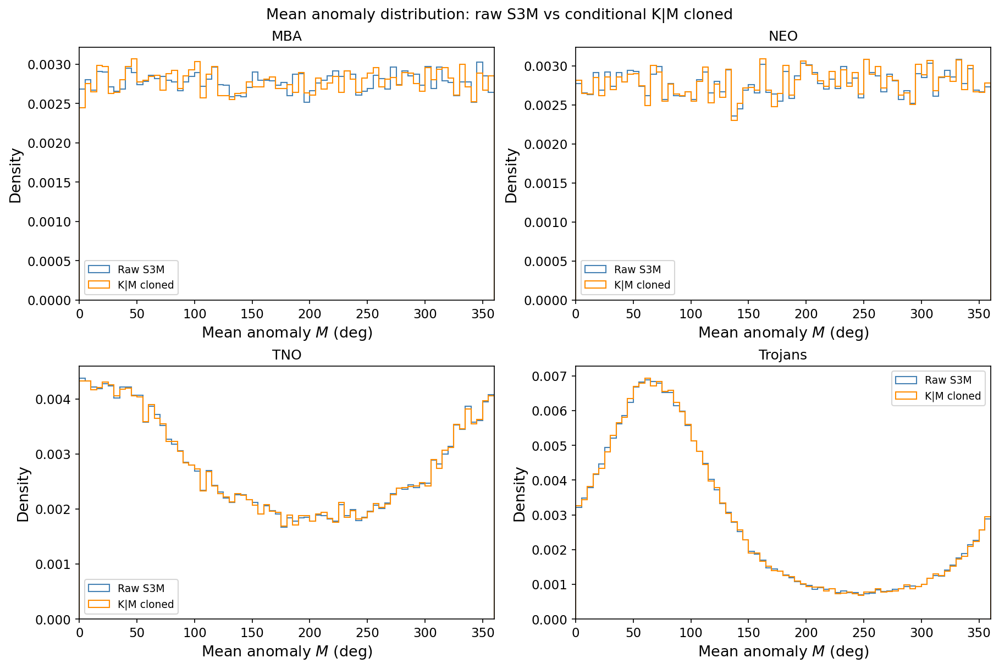

In [109]:
# Mean anomaly M distribution — raw S3M vs K|M cloned (2x2, all populations)
bins_M = np.linspace(0, 360, 73)  # 5-deg bins

fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)
pops = ["MBA", "NEO", "TNO", "Trojans"]

for ax, pop in zip(axes.flatten(), pops):
    d = comp[pop]
    ax.hist(d["raw"]["M"], bins=bins_M, density=True, histtype="step",
            lw=2.0, color="steelblue", label="Raw S3M")
    ax.hist(d["km"]["M"],  bins=bins_M, density=True, histtype="step",
            lw=1.5, color="darkorange", ls="--", label="K|M cloned")
    ax.set_title(pop)
    ax.set_xlabel(r"Mean anomaly $M$ (deg)")
    ax.set_ylabel("Density")
    ax.set_xlim(0, 360)
    ax.legend(fontsize=7, loc="upper right")

fig.suptitle("Mean anomaly distribution: raw S3M vs conditional K|M cloned", fontsize=13)
plt.savefig("comparison_M_distribution.pdf", bbox_inches="tight")
plt.show()

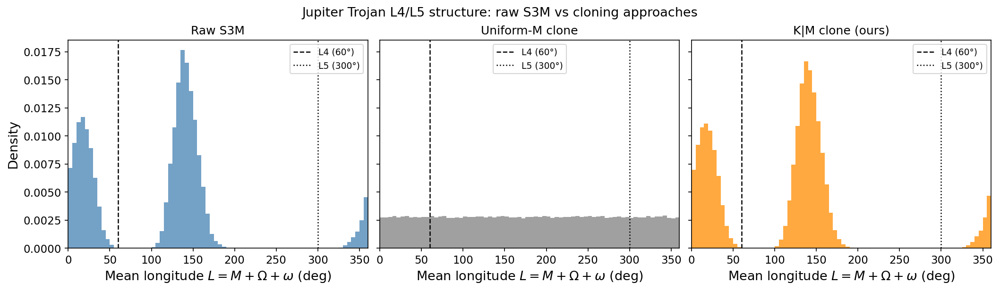

In [110]:
# Trojan L4/L5 preservation
# Three panels: raw | uniform-M clone | K|M clone
# The uniform-M approach destroys the L4/L5 clumps; K|M preserves them.

bins_L = np.linspace(0, 360, 73)
jupiter_L_deg = 80.0  # Jupiter mean longitude at the plotting epoch, approximate
l4_deg = np.mod(jupiter_L_deg + 60.0, 360.0)
l5_deg = np.mod(jupiter_L_deg - 60.0, 360.0)
d = comp["Trojans"]

panels = [
    (d["raw"]["L"],     "Raw S3M",         "steelblue"),
    (d["uniform"]["L"], "Uniform-M clone",  "gray"),
    (d["km"]["L"],      "K|M clone (ours)", "darkorange"),
]

fig, axes = plt.subplots(1, 3, figsize=(14, 4), constrained_layout=True, sharey=True)

for ax, (L, title, color) in zip(axes, panels):
    ax.hist(L, bins=bins_L, color=color, alpha=0.75, density=True)
    ax.axvline(l5_deg, ls=":",  c="k", lw=1.2, label=fr"L5 ($L_J-60^\circ\approx{l5_deg:.0f}^\circ$)")
    ax.axvline(jupiter_L_deg, ls="-.", c="0.35", lw=1.0, label=fr"Jupiter ($L_J\approx{jupiter_L_deg:.0f}^\circ$)")
    ax.axvline(l4_deg, ls="--", c="k", lw=1.2, label=fr"L4 ($L_J+60^\circ\approx{l4_deg:.0f}^\circ$)")
    ax.set_title(title, fontsize=12)
    ax.set_xlabel(r"Mean longitude $L = M + \Omega + \omega$ (deg)")
    ax.set_xlim(0, 360)
    ax.legend(fontsize=7, loc="upper right")

axes[0].set_ylabel("Density")
fig.suptitle(
    "Jupiter Trojan L4/L5 structure: raw S3M vs cloning approaches",
    fontsize=13,
)
plt.savefig("trojan_L4L5_comparison.pdf", bbox_inches="tight")
plt.savefig("trojan_L4L5_comparison.png", bbox_inches="tight", dpi=200)
plt.show()

---
## 10. All-populations heliocentric overview map

Two-panel figure: inner solar system (0–6.5 AU) and full solar system (0–55 AU, adding TNOs).
Uses the ecliptic-strip data from Section 4 (objects with |β| < 3°, so we are
looking roughly in the ecliptic plane).

Reference orbit circles for Earth (1 AU), Mars (1.524 AU), and Jupiter (5.203 AU).
Earth marker at spring-equinox position: λ_Earth ≈ 180° → (−1, 0) AU.

In [111]:
def build_helio_xy_raw(df, clone_factor, obstime_str, max_objects=None, rng=None):
    """Clone orbits and compute heliocentric XY positions without any sky-plane or
    beta filter to avoid the geocentric-proximity gap that appears near Earth when
    using beta-filtered ecliptic strip data."""
    if rng is None:
        rng = np.random.default_rng(42)
    if max_objects is not None and len(df) > max_objects:
        idx = rng.choice(len(df), size=max_objects, replace=False)
        df = df.iloc[idx].reset_index(drop=True)
        print(f"  subsampled df to {len(df)}")

    a_rep, e_rep, inc_rep, raan_rep, argp_rep, tp_out = vdp.clone_population_conditional_K_from_M(
        df=df, clone_factor=clone_factor, obstime_str=obstime_str, rng=rng,
    )
    print(f"  cloned {len(a_rep)} orbits — computing heliocentric positions...")

    r_ecl, _ = nsc.elements_to_helio_ecliptic_state(
        a_AU=a_rep.astype("float64"), e=e_rep.astype("float64"),
        inc_deg=inc_rep.astype("float64"), raan_deg=raan_rep.astype("float64"),
        argp_deg=argp_rep.astype("float64"), tp_mjd=tp_out.astype("float64"),
        obstime_str=obstime_str, method="newton", n_iter=10, show_progress=True,
    )
    scale = vdp.AU_KM if np.nanmedian(np.linalg.norm(r_ecl, axis=1)) > 1000 else 1.0
    return {"x_helio_au": r_ecl[:, 0] / scale, "y_helio_au": r_ecl[:, 1] / scale}

In [112]:
print("=== Raw heliocentric XY — no beta filter ===")
print("MBA (subsampled to 300k)...")
helio_raw_mba = build_helio_xy_raw(
    df_mba, CLONE_FACTORS["MBA"], OBSTIME_STR,
    max_objects=300_000, rng=np.random.default_rng(801),
)
print("NEO (subsampled to 50k × clone_factor)...")
helio_raw_neo = build_helio_xy_raw(
    df_neo, CLONE_FACTORS["NEO"], OBSTIME_STR,
    max_objects=50_000, rng=np.random.default_rng(802),
)
print("TNO...")
helio_raw_tno = build_helio_xy_raw(
    df_tno, CLONE_FACTORS["TNO"], OBSTIME_STR,
    rng=np.random.default_rng(803),
)
print("Trojans...")
helio_raw_trojan = build_helio_xy_raw(
    df_trojan, CLONE_FACTORS["Trojans"], OBSTIME_STR,
    rng=np.random.default_rng(804),
)
helio_raw_data = {
    "MBA": helio_raw_mba, "NEO": helio_raw_neo,
    "TNO": helio_raw_tno, "Trojans": helio_raw_trojan,
}
print("Done.")

=== Raw heliocentric XY — no beta filter ===
MBA (subsampled to 300k)...
  subsampled df to 300000
  cloned 300000 orbits — computing heliocentric positions...


Propagate with newton: 100%|██████████| 1/1 [00:00<00:00, 11.80it/s]

NEO (subsampled to 50k × clone_factor)...
  subsampled df to 50000


  cloned 500000 orbits — computing heliocentric positions...


Propagate with newton: 100%|██████████| 2/2 [00:00<00:00, 12.67it/s]

TNO...


  cloned 486820 orbits — computing heliocentric positions...


Propagate with newton: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s]

Trojans...


  cloned 179882 orbits — computing heliocentric positions...


Propagate with newton: 100%|██████████| 1/1 [00:00<00:00, 22.81it/s]

Done.


In [113]:
# Orbit reference circles
_theta = np.linspace(0, 2 * np.pi, 500)
ORBIT_REFS = [
    (1.000, "Earth",   "#2166ac", "-"),
    (1.524, "Mars",    "#d6604d", "-"),
    (5.203, "Jupiter", "#b35806", "-"),
]

# Per-population scatter style for the overview map
MAP_STYLE = {
    "MBA":     {"color": "orange",   "alpha": 0.30, "s": 0.9, "label": "MBA",     "nmax": 150_000},
    "NEO":     {"color": "royalblue","alpha": 0.06, "s": 1.5, "label": "NEO",     "nmax": None},
    "Trojans": {"color": "purple",   "alpha": 0.22, "s": 0.8, "label": "Trojans", "nmax": 80_000},
    "TNO":     {"color": "green",    "alpha": 0.15, "s": 0.4, "label": "TNO",     "nmax": 80_000},
}

rng_map = np.random.default_rng(900)

def _scatter_pop(ax, pop, data):
    st  = MAP_STYLE[pop]
    xh  = data["x_helio_au"]
    yh  = data["y_helio_au"]
    if st["nmax"] and len(xh) > st["nmax"]:
        idx = rng_map.choice(len(xh), st["nmax"], replace=False)
        xh, yh = xh[idx], yh[idx]
    ax.scatter(xh, yh, s=st["s"], alpha=st["alpha"], color=st["color"],
               label=st["label"], rasterized=True)

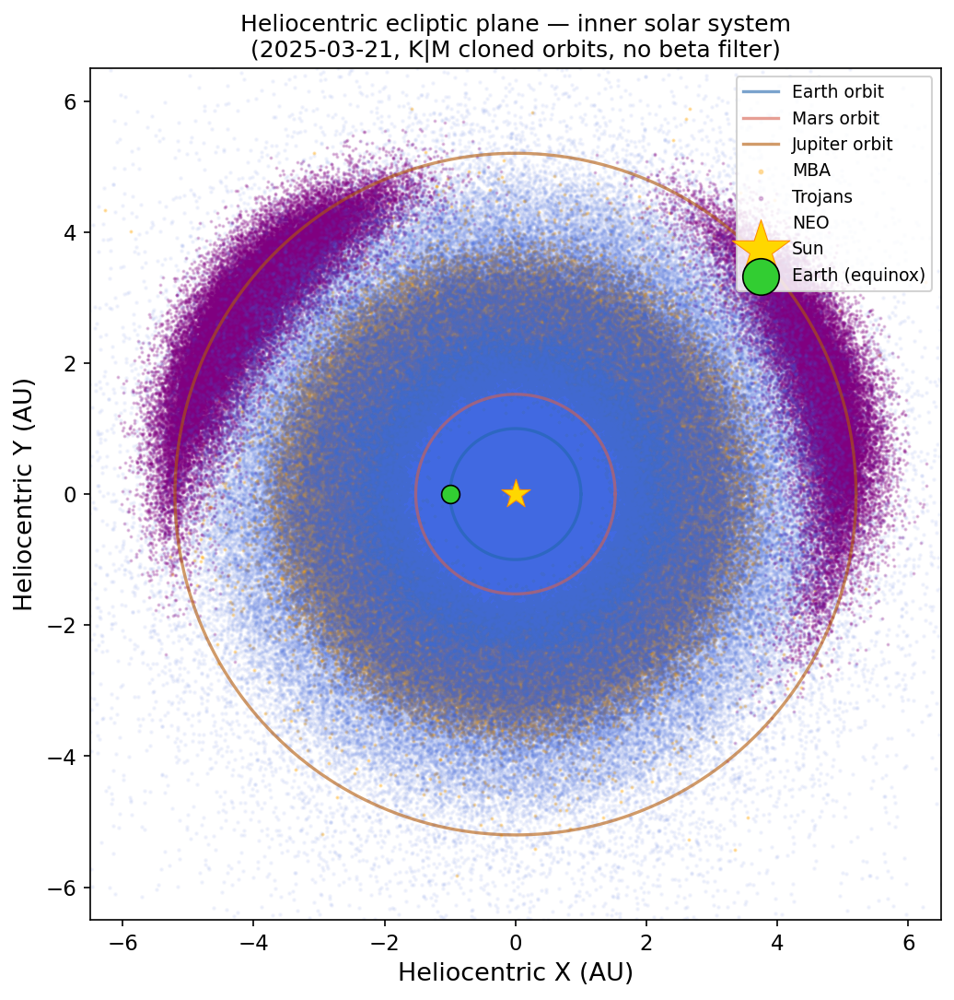

In [114]:
# inner solar system — MBA belt, NEOs, Trojans at L4/L5
fig, ax = plt.subplots(figsize=(8, 8))

for r, name, color, ls in ORBIT_REFS:
    ax.plot(r * np.cos(_theta), r * np.sin(_theta),
            ls=ls, lw=1.6, color=color, alpha=0.6, label=f"{name} orbit")

for pop in ["MBA", "Trojans", "NEO"]:
    _scatter_pop(ax, pop, helio_raw_data[pop])

ax.scatter([0], [0], s=250, marker="*", color="gold",
           edgecolors="darkorange", lw=0.5, zorder=10, label="Sun")
ax.scatter([-1.0], [0], s=90, marker="o", color="limegreen",
           edgecolors="black", linewidths=0.8, zorder=10, label="Earth (equinox)")

ax.set_xlabel("Heliocentric X (AU)")
ax.set_ylabel("Heliocentric Y (AU)")
ax.set_aspect("equal")
ax.set_xlim(-6.5, 6.5)
ax.set_ylim(-6.5, 6.5)
ax.set_title(
    "Heliocentric ecliptic plane — inner solar system\n"
    "(2025-03-21, K|M cloned orbits, no beta filter)"
)
ax.legend(loc="upper right", markerscale=2.0, fontsize=9, framealpha=0.85)
plt.savefig("helio_map_inner.pdf", bbox_inches="tight", dpi=200)
plt.show()

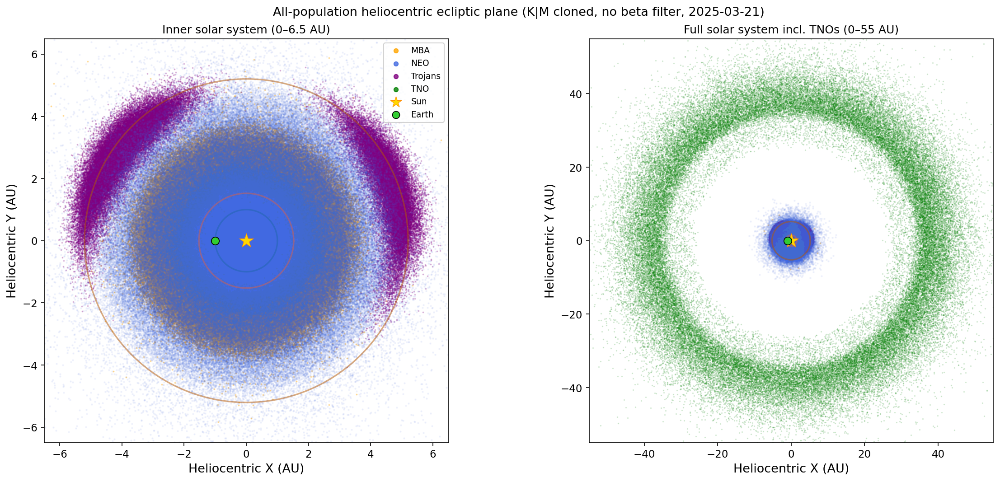

In [115]:
# full solar system — two-panel (inner + outer with TNOs)
fig, (ax_in, ax_out) = plt.subplots(1, 2, figsize=(16, 7), constrained_layout=True)

for ax, xlim, pops_to_plot, show_tno in [
    (ax_in,  6.5,  ["MBA", "Trojans", "NEO"], False),
    (ax_out, 55.0, ["MBA", "Trojans", "NEO"], True),
]:
    for r, _, color, ls in ORBIT_REFS:
        ax.plot(r * np.cos(_theta), r * np.sin(_theta),
                ls=ls, lw=1.6, color=color, alpha=0.5)

    for pop in pops_to_plot:
        _scatter_pop(ax, pop, helio_raw_data[pop])

    if show_tno:
        _scatter_pop(ax, "TNO", helio_raw_data["TNO"])

    ax.scatter([0], [0], s=250, marker="*", color="gold",
               edgecolors="darkorange", lw=0.5, zorder=10)
    ax.scatter([-1.0], [0], s=70, marker="o", color="limegreen",
               edgecolors="black", linewidths=0.8, zorder=10)

    ax.set_xlabel("Heliocentric X (AU)")
    ax.set_ylabel("Heliocentric Y (AU)")
    ax.set_aspect("equal")
    ax.set_xlim(-xlim, xlim)
    ax.set_ylim(-xlim, xlim)

ax_in.set_title("Inner solar system (0–6.5 AU)")
ax_out.set_title("Full solar system incl. TNOs (0–55 AU)")

handles = [
    plt.scatter([], [], s=20, color=MAP_STYLE[p]["color"],
                alpha=0.8, label=MAP_STYLE[p]["label"])
    for p in ["MBA", "NEO", "Trojans", "TNO"]
]
handles += [
    plt.scatter([], [], s=150, marker="*", color="gold",
                edgecolors="darkorange", lw=0.5, label="Sun"),
    plt.scatter([], [], s=60,  marker="o", color="limegreen",
                edgecolors="black", linewidths=0.8, label="Earth"),
]
ax_in.legend(handles=handles, loc="upper right", fontsize=9, framealpha=0.85)

fig.suptitle(
    "All-population heliocentric ecliptic plane (K|M cloned, no beta filter, 2025-03-21)",
    fontsize=13,
)
plt.savefig("helio_map_all_populations.pdf", bbox_inches="tight", dpi=200)
plt.show()

---
## 11. Velocity-space density and probability maps

Loaded from `prob_maps_2026-05-09T22_neocp.npz`, generated by `vdp.generate_probability_maps()`  
(center = ecliptic lon=229°, lat=0°, max_sep=30°, NEO clone_factor=300).

**Available mag bins:** `14_16 · 16_18 · 18_20 · mag20 · mag21 · mag22 · mag23 · mag24+`

| Function | Output |
|---|---|
| `plot_velocity_maps(prob_mapset, label, mode)` | 2×2 grid — one bin, all pops (matches pre_refactor screenshots) |
| `plot_bins_comparison(prob_mapset, bin_labels, mode)` | 4 pops × N bins grid — side-by-side comparison |

`mode = "density"` → log₁₀ downweighted raw density, including any support-masked smoothing saved in the map file  
`mode = "probability"` → population fraction with 0.2 deg/day nearest-object mask

In [116]:
# Load pre-computed probability maps (vdp.generate_probability_maps output)(can switch to other map paths after making them through download_prob_maps.ioynb)
# Covers 2026-05-09T22, center=(229, 0), max_sep=30°, NEO clone_factor=300,
# DEFAULT_MAG_BINS: 14_16, 16_18, 18_20, mag20, mag21, mag22, mag23, mag24+
PROB_MAPS_PATH = "prob_maps_2026-05-09T22_neocp.npz"
prob_mapset = vdp.ProbMapSet.from_npz(PROB_MAPS_PATH)
X0_map, Y0_map = prob_mapset.get_xy_meshgrid()

print("Loaded:", PROB_MAPS_PATH)
print("Center  :", prob_mapset.center_lon_deg, prob_mapset.center_lat_deg)
print("Bins    :", [mb["label"] for mb in prob_mapset.mag_bins])
print("Pops    :", prob_mapset.population_names)
print("Smoothing:", prob_mapset.smoothing)

Loaded: prob_maps_2026-05-09T22_neocp.npz
Center  : 229.0 0.0
Bins    : ['14_16', '16_18', '18_20', 'mag20', 'mag21', 'mag22', 'mag23', 'mag24+']
Pops    : ['MBA', 'NEO', 'TNO', 'Trojans']
Smoothing: {'enabled': True, 'population_names': ['NEO'], 'support_scale_by_clone_factor': True, 'passes': [{'support_threshold': 3.0, 'sigma_pixels': 1.5, 'truncate_sigma': 5.0}, {'support_threshold': 10.0, 'sigma_pixels': 4.0, 'truncate_sigma': 5.0}], 'support_threshold': 10.0, 'sigma_pixels': 4.0, 'truncate_sigma': 5.0}


In [117]:
_VEL_LIM = (-0.8, 0.8)


def _density_log_map(density):
    """Log10 density with 5-decade dynamic range.
    Pixels with no density support are masked so empty maps do not plot as bright."""
    density = np.asarray(density, dtype=float)
    positive = np.isfinite(density) & (density > 0)
    log_map = np.ma.masked_all(density.shape, dtype=float)
    if np.any(positive):
        log_map[positive] = np.log10(density[positive])
        vmax = float(np.nanmax(log_map))
        vmin = vmax - 5.0
    else:
        vmin, vmax = 0.0, 1.0
    return log_map, vmin, vmax


def _density_cmap():
    cmap = mpl.colormaps["viridis"].copy()
    cmap.set_bad("0.88")
    return cmap


def _annotate_no_support(ax, data):
    if np.ma.isMaskedArray(data) and np.ma.count(data) == 0:
        ax.text(
            0.5, 0.5, "no support", transform=ax.transAxes,
            ha="center", va="center", fontsize=10, color="0.25",
        )


def plot_velocity_maps(prob_mapset, label, pops=None, mode="density", save_path=None):
    """2×2 grid — one mag bin, all populations.

    mode = 'density'     → log10 density, 5-decade dynamic range
    mode = 'probability' → population fraction with 0.2 deg/day nearest-object mask
    """
    if pops is None:
        pops = prob_mapset.population_names[:4]
    X0, Y0 = prob_mapset.get_xy_meshgrid()
    center = f"({prob_mapset.center_lon_deg:g},{prob_mapset.center_lat_deg:g})"

    fig, axes = plt.subplots(2, 2, figsize=(14, 12), constrained_layout=True)
    axes = axes.ravel()

    for ax, pop in zip(axes, pops):
        if mode == "density":
            d = prob_mapset.results[label]["density_maps_downweighted_raw"][pop]
            data, vmin, vmax = _density_log_map(d)
            cmap, cb_label = _density_cmap(), r"$\log_{10}\langle n_0 \rangle$"
        else:
            data = prob_mapset.get_probability_map(label, pop)
            vmin, vmax = 0.0, 1.0
            cmap, cb_label = "viridis", "probability"

        im = ax.imshow(
            data, origin="lower",
            extent=(_VEL_LIM[0], _VEL_LIM[1], _VEL_LIM[0], _VEL_LIM[1]),
            cmap=cmap, vmin=vmin, vmax=vmax,
            interpolation="bilinear", aspect="equal",
        )
        _annotate_no_support(ax, data)
        fig.colorbar(im, ax=ax, label=cb_label)
        ax.set_title(f"{pop}: {label}, center={center}")
        ax.set_xlabel(r"$v_\lambda$ (deg/day)")
        ax.set_ylabel(r"$v_\beta$ (deg/day)")
        ax.set_xlim(*_VEL_LIM)
        ax.set_ylim(*_VEL_LIM)

    _save_figure(fig, save_path, dpi=180)
    plt.show()


def plot_bins_comparison(prob_mapset, bin_labels, pops=None, mode="density",
                         panel_w=5.5, panel_h=4.5, save_path=None):
    """4 rows (populations) × N cols (mag bins) comparison grid.

    mode = 'density'     → log10, 5-decade dynamic range 
    mode = 'probability' → 0–1 fraction with 0.2 deg/day nearest-object mask
    panel_w, panel_h : inches per panel — tune for paper vs. poster
    """
    if pops is None:
        pops = prob_mapset.population_names[:4]
    X0, Y0 = prob_mapset.get_xy_meshgrid()
    n_bins = len(bin_labels)
    center = f"({prob_mapset.center_lon_deg:g},{prob_mapset.center_lat_deg:g})"

    fig, axes = plt.subplots(
        len(pops), n_bins,
        figsize=(panel_w * n_bins, panel_h * len(pops)),
        constrained_layout=True,
    )
    axes = np.atleast_2d(axes)
    if len(pops) == 1:
        axes = axes[np.newaxis, :]
    if n_bins == 1:
        axes = axes[:, np.newaxis]

    for row, pop in enumerate(pops):
        for col, label in enumerate(bin_labels):
            ax = axes[row, col]
            if mode == "density":
                d = prob_mapset.results[label]["density_maps_downweighted_raw"][pop]
                data, vmin, vmax = _density_log_map(d)
                cmap, cb_label = _density_cmap(), r"$\log_{10}\langle n_0 \rangle$"
            else:
                data = prob_mapset.get_probability_map(label, pop)
                vmin, vmax = 0.0, 1.0
                cmap, cb_label = "viridis", "probability"

            im = ax.imshow(
                data, origin="lower",
                extent=(_VEL_LIM[0], _VEL_LIM[1], _VEL_LIM[0], _VEL_LIM[1]),
                cmap=cmap, vmin=vmin, vmax=vmax,
                interpolation="bilinear", aspect="equal",
            )
            _annotate_no_support(ax, data)
            fig.colorbar(im, ax=ax, label=cb_label)
            ax.set_title(f"{pop}: {label}", fontsize=11)
            ax.set_xlabel(r"$v_\lambda$ (deg/day)")
            ax.set_ylabel(r"$v_\beta$ (deg/day)")
            ax.set_xlim(*_VEL_LIM)
            ax.set_ylim(*_VEL_LIM)

    mode_title = "Log density" if mode == "density" else "Probability (0.2 deg/day mask)"
    fig.suptitle(f"{mode_title} — center={center}", fontsize=13)

    _save_figure(fig, save_path, dpi=180)
    plt.show()


=== Density map: 14_16 ===


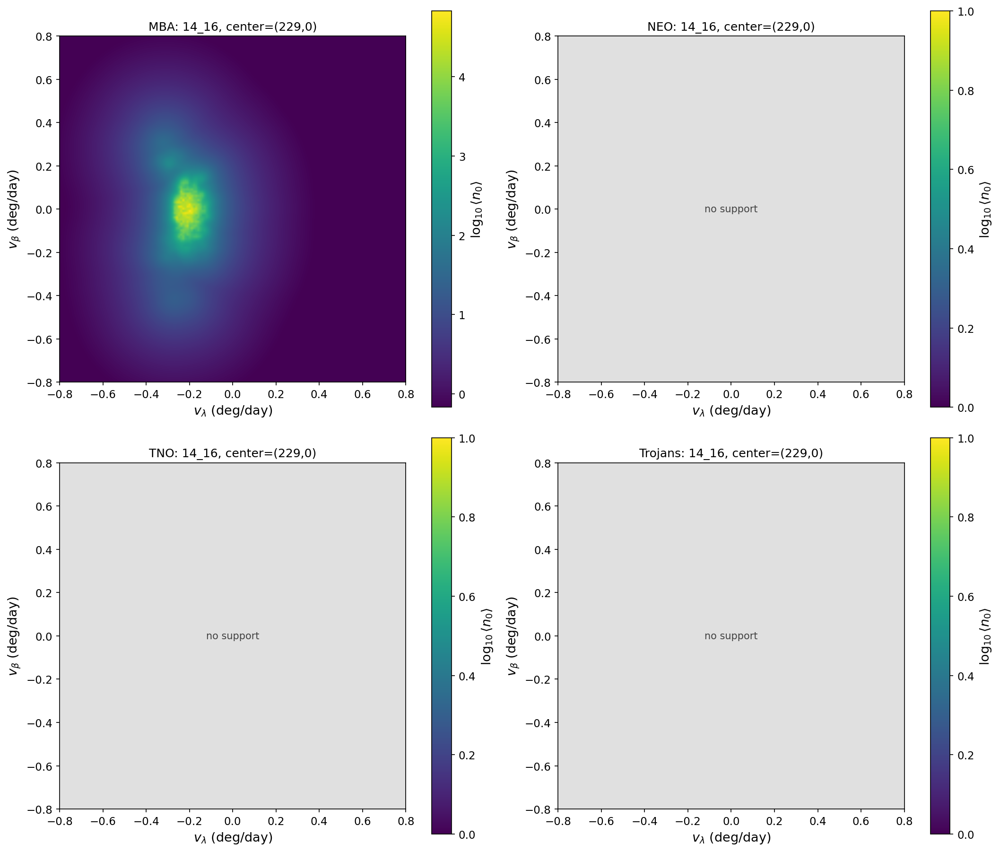

=== Probability map: 14_16 ===


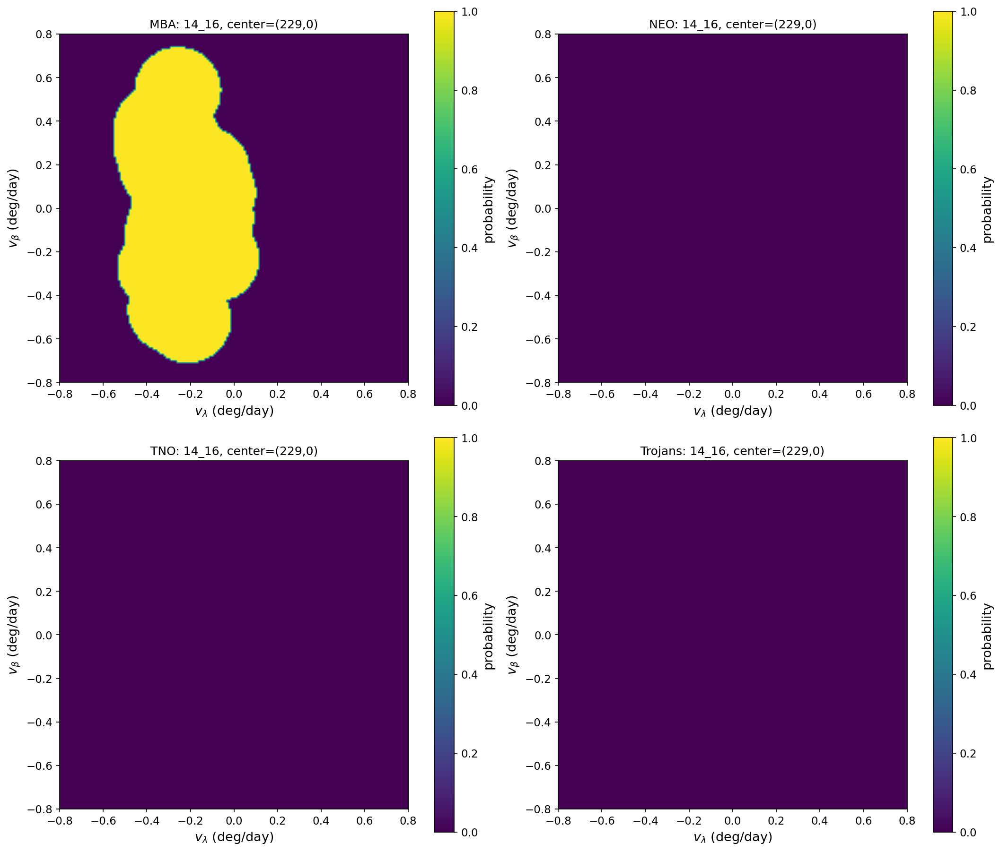


=== Density map: mag20 ===


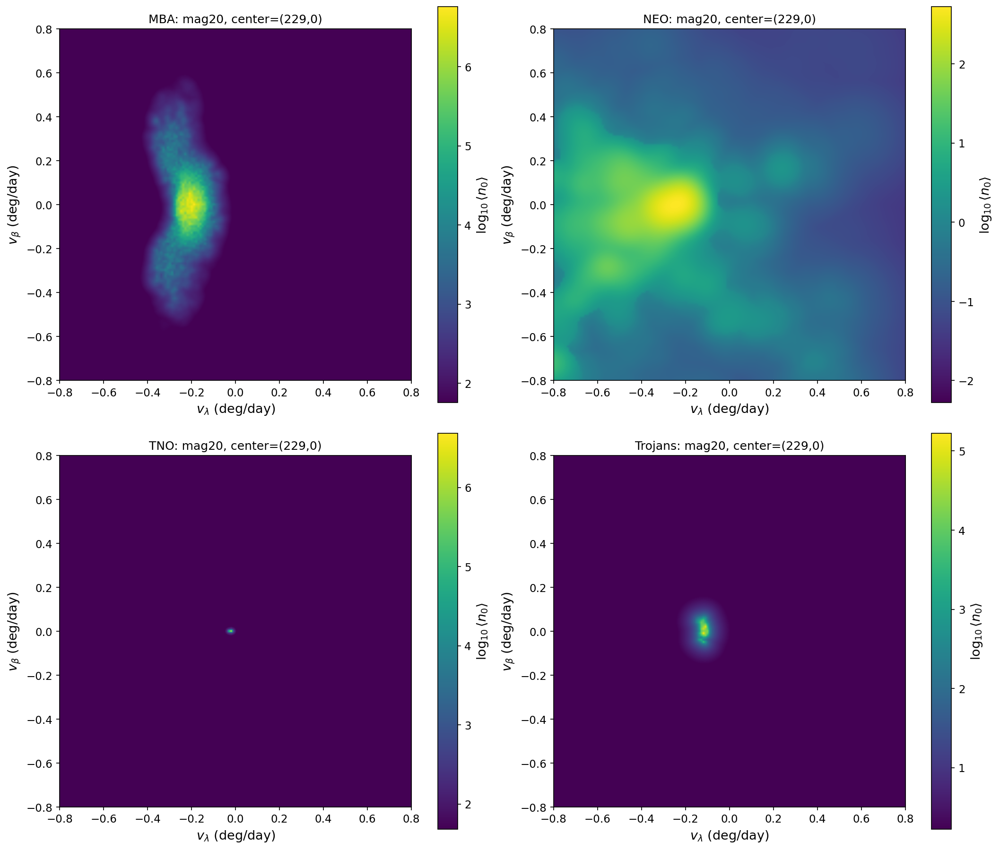

=== Probability map: mag20 ===


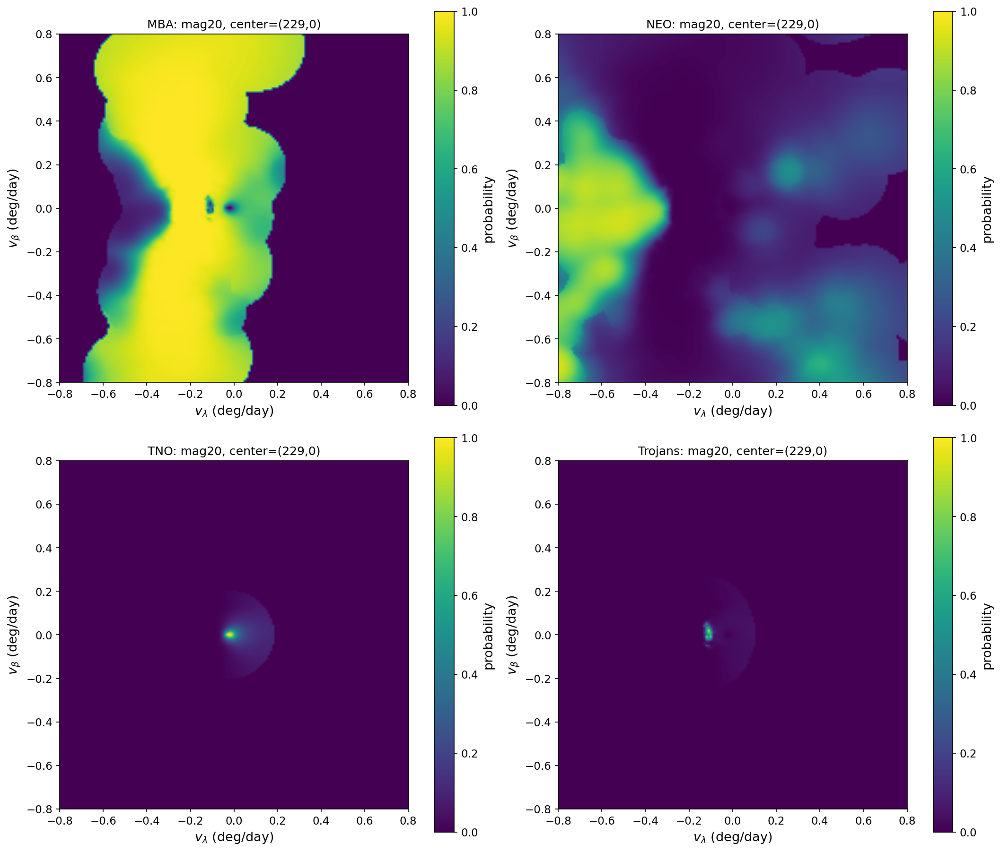


=== Density map: mag21 ===


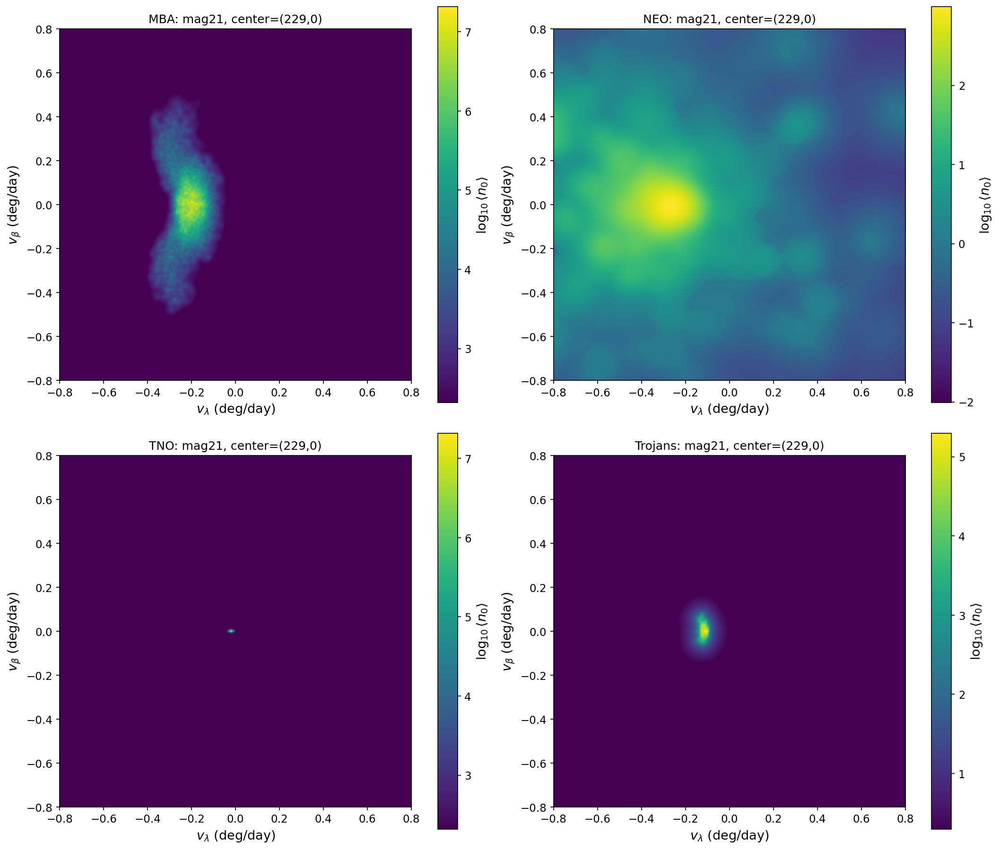

=== Probability map: mag21 ===


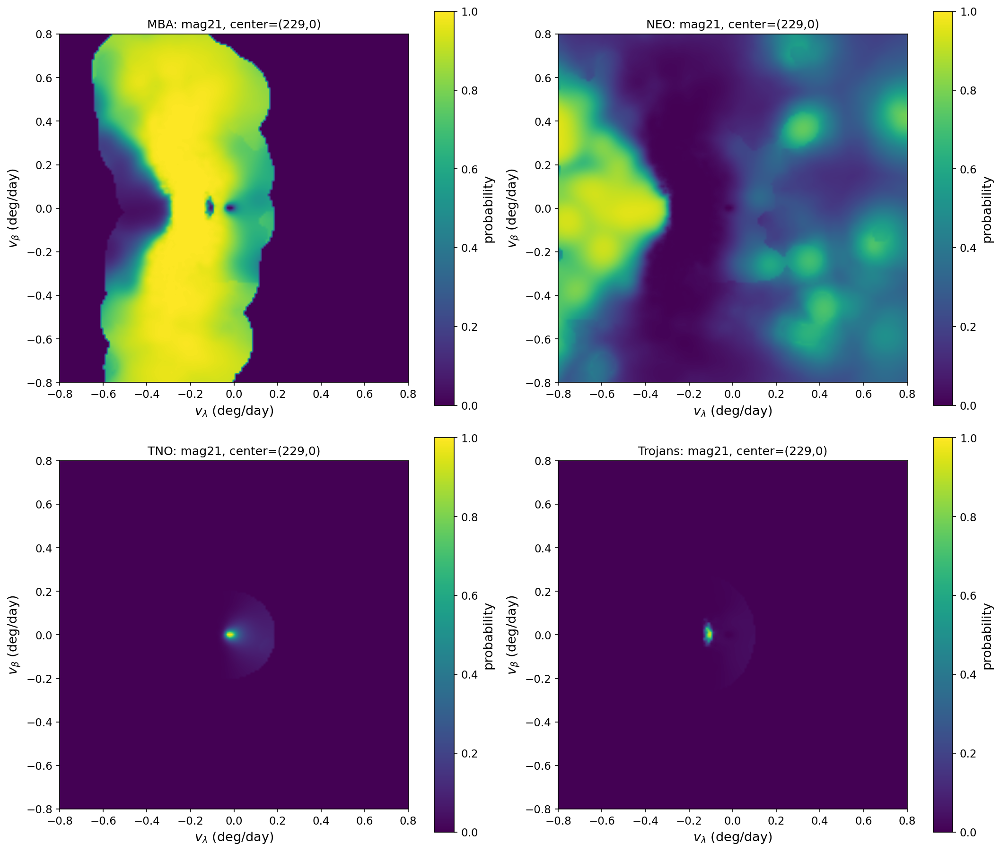


=== Density map: mag24+ ===


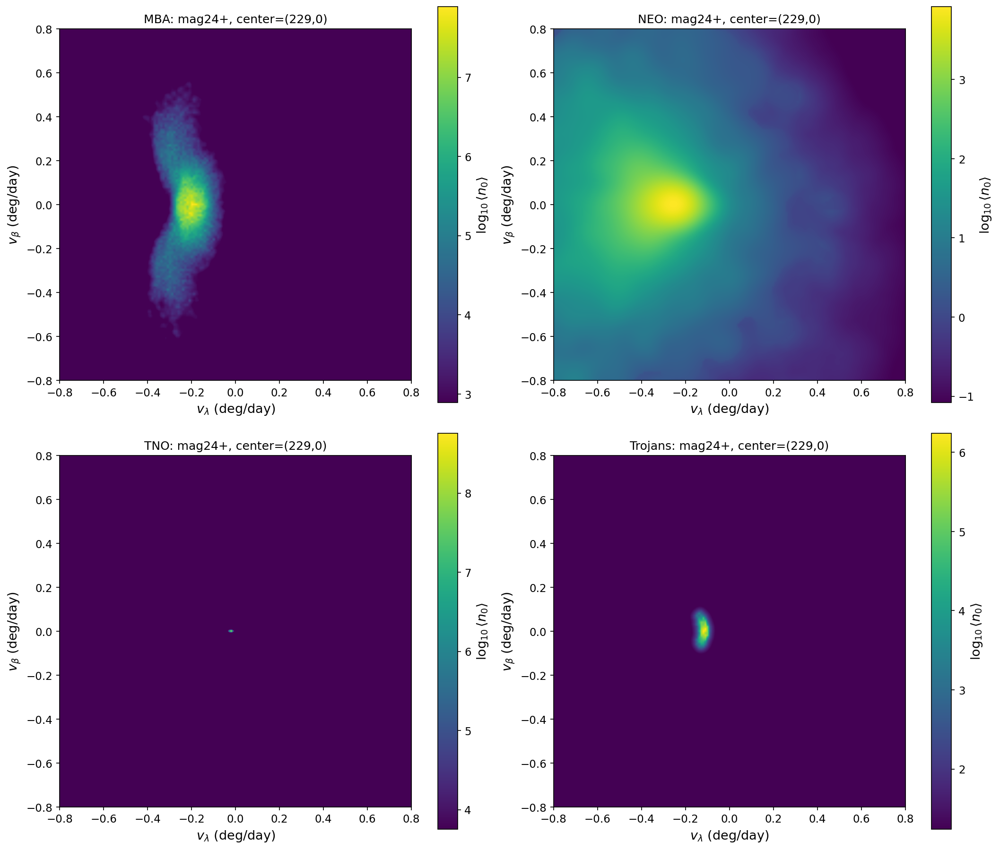

=== Probability map: mag24+ ===


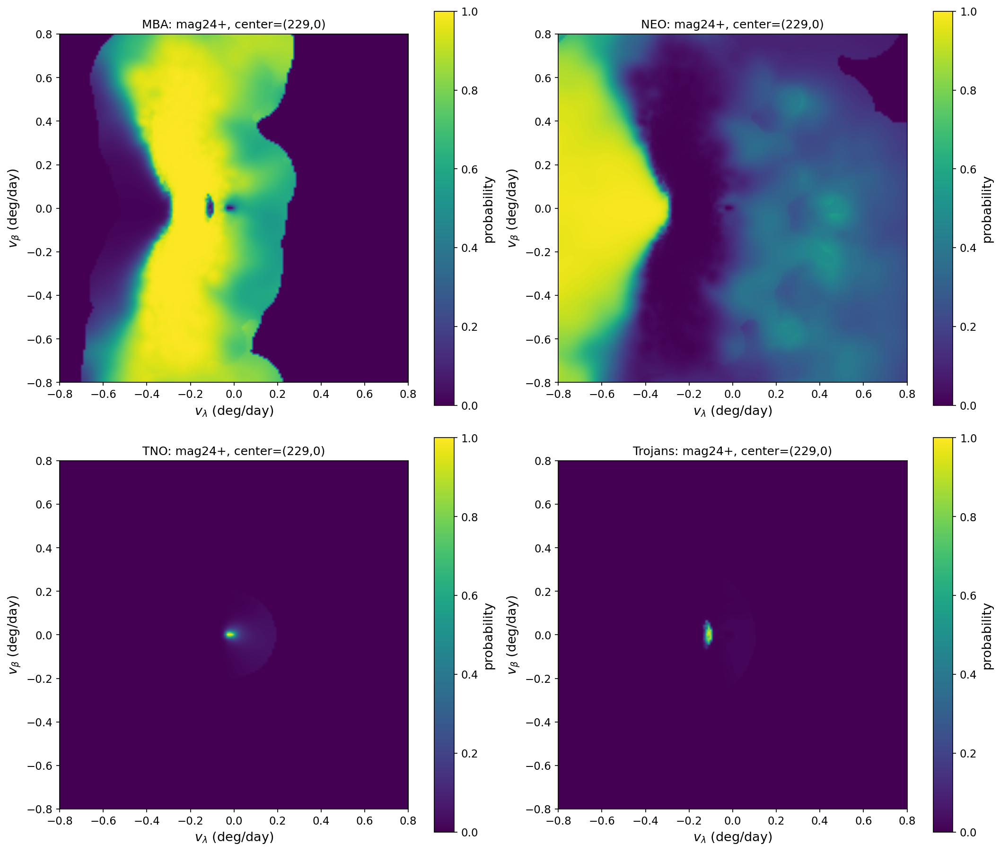

In [118]:
# Change SHOW_BINS to any subset of prob_mapset.mag_bins labels
SHOW_BINS = ["14_16", "mag20", "mag21", "mag24+"]

for lbl in SHOW_BINS:
    print(f"\n=== Density map: {lbl} ===")
    plot_velocity_maps(prob_mapset, label=lbl, mode="density",
                       save_path=[f"density_map_{lbl}.pdf", f"density_map_{lbl}.png"])
    print(f"=== Probability map: {lbl} ===")
    plot_velocity_maps(prob_mapset, label=lbl, mode="probability",
                       save_path=[f"probability_map_{lbl}.pdf", f"probability_map_{lbl}.png"])

=== Three-bin density comparison ===


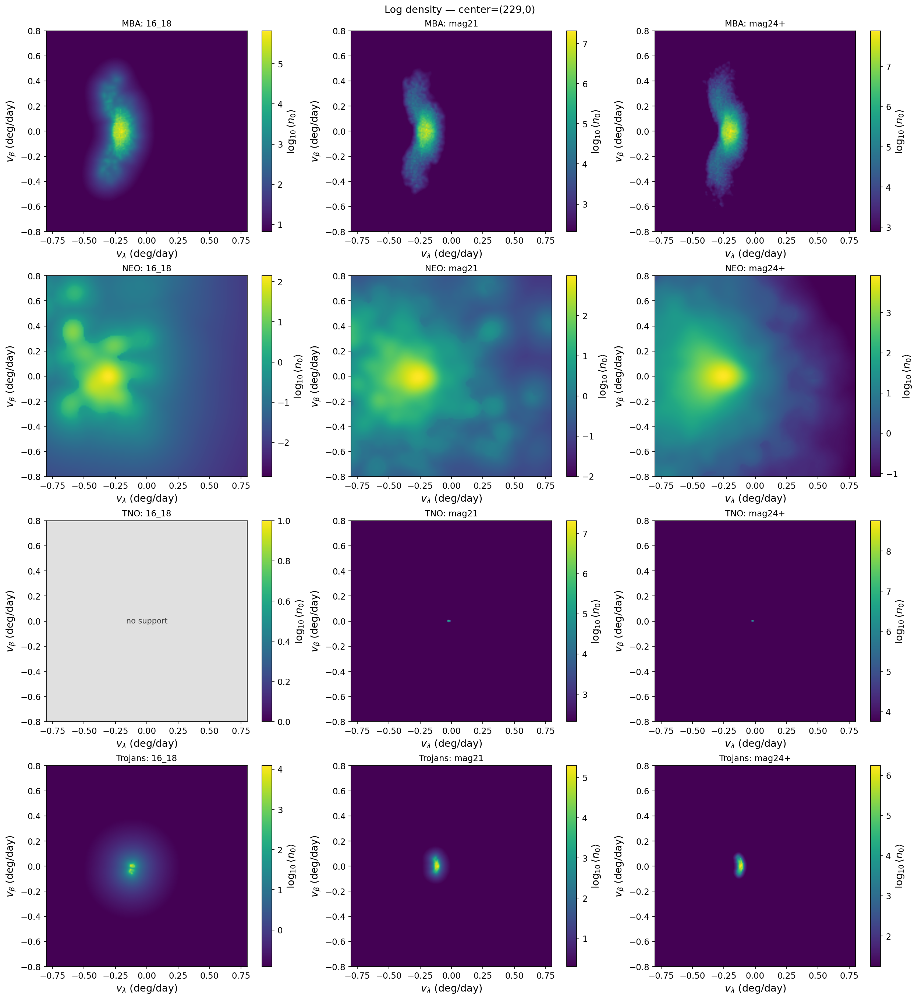

=== Three-bin probability comparison ===


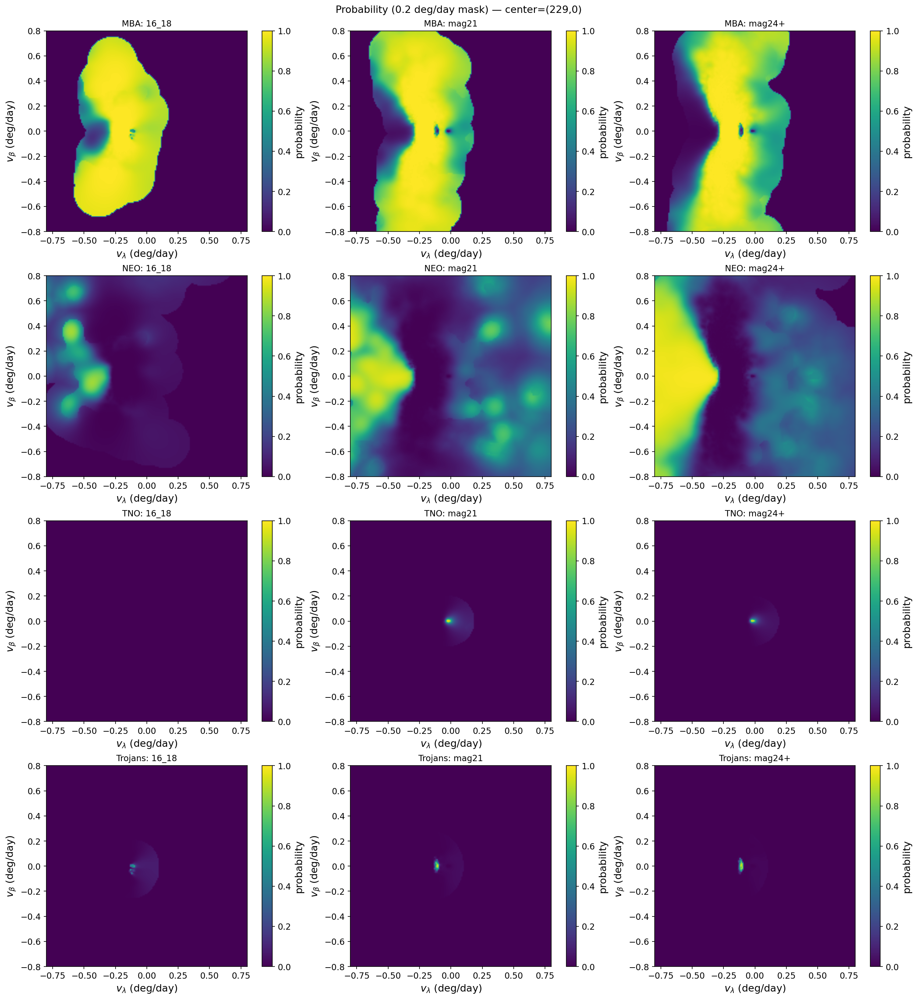

In [119]:
# ── Three-bin comparison (paper/poster figure) ──────────────────────────────
# Pick any three labels from prob_mapset.mag_bins
THREE_BINS = ["16_18", "mag21", "mag24+"]

print("=== Three-bin density comparison ===")
plot_bins_comparison(
    prob_mapset, bin_labels=THREE_BINS, mode="density",
    save_path=["density_comparison_three_bins.pdf", "density_comparison_three_bins.png"],
)

print("=== Three-bin probability comparison ===")
plot_bins_comparison(
    prob_mapset, bin_labels=THREE_BINS, mode="probability",
    save_path=["probability_comparison_three_bins.pdf", "probability_comparison_three_bins.png"],
)

## 12. Direction comparison maps

Four-panel comparison of the actual anti-Sun direction and the three new ecliptic-offset map centers generated from `download_prob_maps.ipynb`.

In [ ]:
from pathlib import Path

# Existing file note: prob_maps_2026-05-09T22_neocp.npz is centered at lon=229, lat=0,
# which is the actual anti-Sun-ish direction for 2026-05-09T22. The file named
# prob_maps_2026-05-09T22_antisun.npz is an older lon=180 map, so it is not used here.
DIRECTION_MAP_PATHS = {
    "Anti-Sun": "prob_maps_2026-05-09T22_neocp.npz",
    "Anti-Sun -45 deg": "prob_maps_2026-05-09_antisun_minus_45.npz",
    "Anti-Sun -90 deg": "prob_maps_2026-05-09_antisun_minus_90.npz",
    "Anti-Sun -120 deg": "prob_maps_2026-05-09_antisun_minus_120.npz",
}

direction_mapsets = {
    label: vdp.ProbMapSet.from_npz(path)
    for label, path in DIRECTION_MAP_PATHS.items()
}

for label, pms in direction_mapsets.items():
    print(
        f"{label:17s}: obstime={pms.obstime_str}, "
        f"center=({pms.center_lon_deg:.3f}, {pms.center_lat_deg:.3f})"
    )


def plot_direction_comparison(
    mapsets,
    pop="NEO",
    mag_bin_label="mag21",
    mode="density",
    save_path=None,
    figsize=(10.5, 9.0),
    dpi=200,
):
    """2x2 comparison for one population and mag bin across sky directions.

    mode = 'density'     -> shared-scale log10 downweighted raw density
    mode = 'probability' -> shared 0-1 population probability map
    """
    panels = []
    for direction_label, pms in mapsets.items():
        if mode == "density":
            density = pms.results[mag_bin_label]["density_maps_downweighted_raw"][pop]
            data, _, _ = _density_log_map(density)
            cb_label = r"$\log_{10}\langle n_0 \rangle$"
        elif mode == "probability":
            data = pms.get_probability_map(mag_bin_label, pop)
            cb_label = "probability"
        else:
            raise ValueError("mode must be 'density' or 'probability'")
        panels.append((direction_label, pms, data))

    if mode == "density":
        supported = [data for _, _, data in panels if np.ma.count(data) > 0]
        if supported:
            vmax = max(float(np.nanmax(data)) for data in supported)
            vmin = vmax - 5.0
        else:
            vmin, vmax = 0.0, 1.0
    else:
        vmin, vmax = 0.0, 1.0

    fig, axes = plt.subplots(2, 2, figsize=figsize, constrained_layout=True)
    axes = axes.ravel()
    im = None

    for ax, (direction_label, pms, data) in zip(axes, panels):
        im = ax.imshow(
            data,
            origin="lower",
            extent=(_VEL_LIM[0], _VEL_LIM[1], _VEL_LIM[0], _VEL_LIM[1]),
            cmap=_density_cmap() if mode == "density" else "viridis",
            vmin=vmin,
            vmax=vmax,
            interpolation="bilinear",
            aspect="equal",
        )
        ax.set_title(
            f"{direction_label}\n"
            f"center=({pms.center_lon_deg:.1f}, {pms.center_lat_deg:.1f})",
            fontsize=11,
        )
        _annotate_no_support(ax, data)
        ax.set_xlabel(r"$v_\lambda$ (deg/day)")
        ax.set_ylabel(r"$v_\beta$ (deg/day)")
        ax.set_xlim(*_VEL_LIM)
        ax.set_ylim(*_VEL_LIM)

    fig.colorbar(im, ax=axes, label=cb_label, shrink=0.9)
    mode_title = "Log density" if mode == "density" else "Probability (0.2 deg/day mask)"
    fig.suptitle(f"{mode_title}: {pop}, {mag_bin_label}", fontsize=13)

    _save_figure(fig, save_path, dpi=dpi)
    plt.show()
    return fig, axes


def _mag_bin_display(label):
    return {
        "14_16": "14-16",
        "16_18": "16-18",
        "18_20": "18-20",
        "mag20": "20-21",
        "mag21": "21-22",
        "mag22": "22-23",
        "mag23": "23-24",
        "mag24+": "24-25",
    }.get(label, label)


def _direction_map_data(pms, pop, mag_bin_label, mode):
    if mode == "density":
        density = pms.results[mag_bin_label]["density_maps_downweighted_raw"][pop]
        data, _, _ = _density_log_map(density)
        return data
    if mode == "probability":
        return pms.get_probability_map(mag_bin_label, pop)
    raise ValueError("mode must be 'density' or 'probability'")


def plot_direction_population_mag_grid(
    mapsets,
    pops=("MBA", "NEO"),
    mag_bin_labels=("14_16", "mag21", "mag24+"),
    mode="density",
    save_path=None,
    figsize=(14.5, 18.0),
    dpi=220,
):
    """6x4 grid: MBA rows for selected mag bins, then NEO rows for same bins.

    Columns are sky directions. Rows are population x magnitude bin.
    Density rows use a shared color scale across directions for that row.
    """
    direction_items = list(mapsets.items())
    row_specs = [(pop, label) for pop in pops for label in mag_bin_labels]
    nrows = len(row_specs)
    ncols = len(direction_items)

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=figsize,
        sharex=True,
        sharey=True,
        constrained_layout=True,
    )
    axes = np.asarray(axes)

    for row, (pop, mag_bin_label) in enumerate(row_specs):
        row_data = [
            _direction_map_data(pms, pop, mag_bin_label, mode)
            for _, pms in direction_items
        ]
        if mode == "density":
            supported = [data for data in row_data if np.ma.count(data) > 0]
            if supported:
                vmax = max(float(np.nanmax(data)) for data in supported)
                vmin = vmax - 5.0
            else:
                vmin, vmax = 0.0, 1.0
            cb_label = r"$\log_{10}\langle n_0 \rangle$"
        else:
            vmin, vmax = 0.0, 1.0
            cb_label = "probability"

        im = None
        for col, ((direction_label, pms), data) in enumerate(zip(direction_items, row_data)):
            ax = axes[row, col]
            im = ax.imshow(
                data,
                origin="lower",
                extent=(_VEL_LIM[0], _VEL_LIM[1], _VEL_LIM[0], _VEL_LIM[1]),
                cmap=_density_cmap() if mode == "density" else "viridis",
                vmin=vmin,
                vmax=vmax,
                interpolation="bilinear",
                aspect="equal",
            )
            ax.axvline(0.0, color="white", lw=0.7, ls="--", alpha=0.7, zorder=5)
            ax.axhline(0.0, color="white", lw=0.7, ls="--", alpha=0.7, zorder=5)
            _annotate_no_support(ax, data)
            if row == 0:
                ax.set_title(
                    f"{direction_label}\n"
                    f"lon={pms.center_lon_deg:.1f}, lat={pms.center_lat_deg:.1f}",
                    fontsize=10,
                )
            if col == 0:
                ax.set_ylabel(
                    f"{pop}: {_mag_bin_display(mag_bin_label)}\n"
                    r"$v_\beta$ (deg/day)",
                    fontsize=15,
                )
            if row == nrows - 1:
                ax.set_xlabel(r"$v_\lambda$ (deg/day)", fontsize=15)
            ax.set_xlim(*_VEL_LIM)
            ax.set_ylim(*_VEL_LIM)
            ax.tick_params(labelsize=10)

        cbar = fig.colorbar(im, ax=axes[row, :], label=cb_label, shrink=0.76, pad=0.012)
        cbar.ax.tick_params(labelsize=10)
        cbar.ax.yaxis.label.set_size(15)

    mode_title = "Log density" if mode == "density" else "Probability (0.2 deg/day mask)"
    pop_title = " and ".join(pops)
    fig.suptitle(
        f"{mode_title} direction comparison: {pop_title}",
        fontsize=14,
    )
    _save_figure(fig, save_path, dpi=dpi)
    plt.show()
    return fig, axes


Anti-Sun         : obstime=2026-05-09T22:00:00, center=(229.000, 0.000)
Anti-Sun -45 deg : obstime=2026-05-09T00:00:00, center=(183.021, 0.000)
Anti-Sun -90 deg : obstime=2026-05-09T00:00:00, center=(138.021, 0.000)
Anti-Sun -120 deg: obstime=2026-05-09T00:00:00, center=(108.021, 0.000)


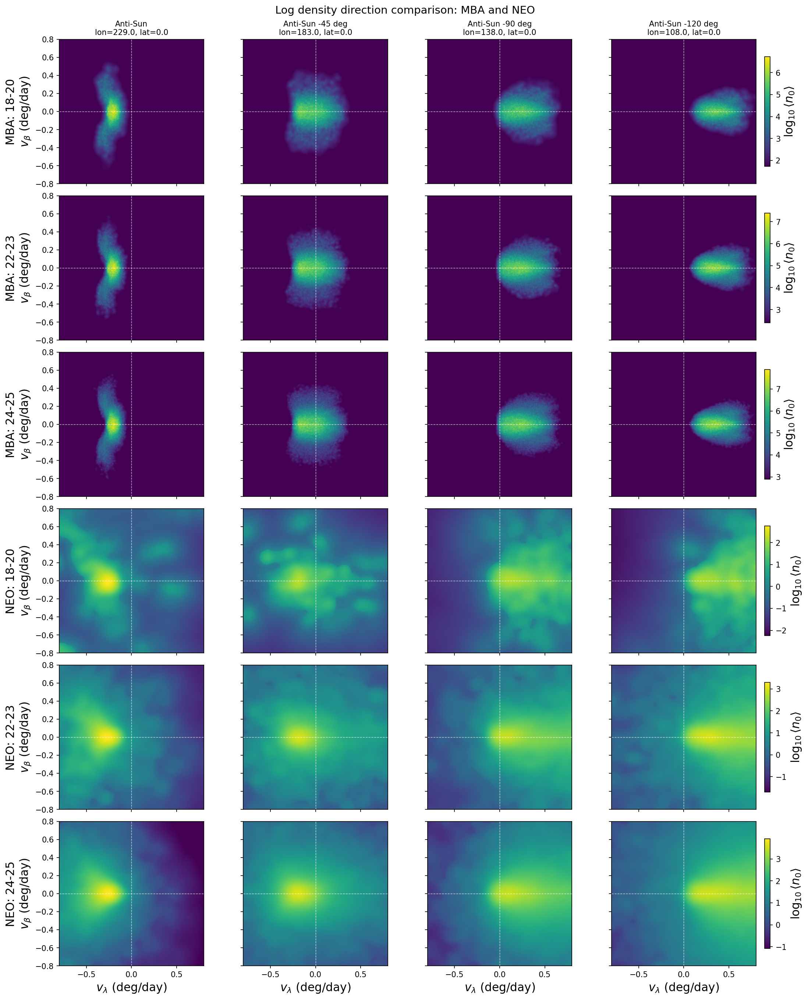

(<Figure size 2175x2700 with 30 Axes>,
 array([[<Axes: title={'center': 'Anti-Sun\nlon=229.0, lat=0.0'}, ylabel='MBA: 18-20\n$v_\\beta$ (deg/day)'>,
         <Axes: title={'center': 'Anti-Sun -45 deg\nlon=183.0, lat=0.0'}>,
         <Axes: title={'center': 'Anti-Sun -90 deg\nlon=138.0, lat=0.0'}>,
         <Axes: title={'center': 'Anti-Sun -120 deg\nlon=108.0, lat=0.0'}>],
        [<Axes: ylabel='MBA: 22-23\n$v_\\beta$ (deg/day)'>, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: ylabel='MBA: 24-25\n$v_\\beta$ (deg/day)'>, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: ylabel='NEO: 18-20\n$v_\\beta$ (deg/day)'>, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: ylabel='NEO: 22-23\n$v_\\beta$ (deg/day)'>, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: xlabel='$v_\\lambda$ (deg/day)', ylabel='NEO: 24-25\n$v_\\beta$ (deg/day)'>,
         <Axes: xlabel='$v_\\lambda$ (deg/day)'>,
         <Axes: xlabel='$v_\\lambda$ (deg/day)'>,
         <Axes: xlabel='$v_\\la

In [ ]:
# 24-panel paper-style direction comparison:
# columns = anti-Sun, -45 deg, -90 deg, -120 deg
# rows    = MBA at 14-16, 21-22, 24-25; then NEO at the same mag bins
DIRECTION_BINS = ["18_20", "mag22", "mag24+"]
DIRECTION_MODE = "density"

plot_direction_population_mag_grid(
    direction_mapsets,
    pops=("MBA", "NEO"),
    mag_bin_labels=DIRECTION_BINS,
    mode=DIRECTION_MODE,
    save_path=[
        f"{DIRECTION_MODE}_direction_comparison_MBA_NEO_24panel.pdf",
        f"{DIRECTION_MODE}_direction_comparison_MBA_NEO_24panel.png",
    ],
)


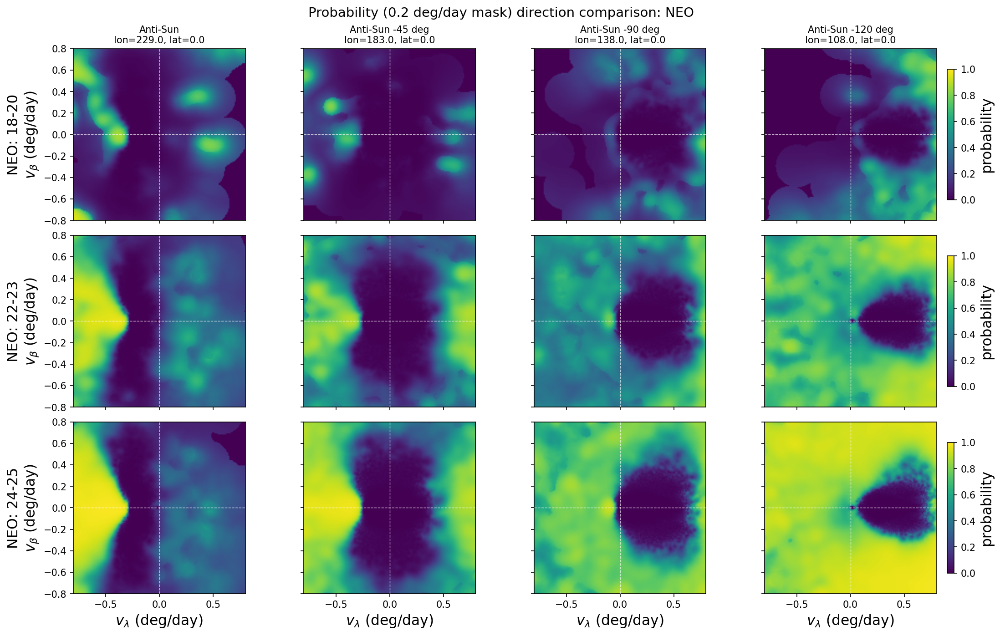

(<Figure size 2175x1380 with 15 Axes>,
 array([[<Axes: title={'center': 'Anti-Sun\nlon=229.0, lat=0.0'}, ylabel='NEO: 18-20\n$v_\\beta$ (deg/day)'>,
         <Axes: title={'center': 'Anti-Sun -45 deg\nlon=183.0, lat=0.0'}>,
         <Axes: title={'center': 'Anti-Sun -90 deg\nlon=138.0, lat=0.0'}>,
         <Axes: title={'center': 'Anti-Sun -120 deg\nlon=108.0, lat=0.0'}>],
        [<Axes: ylabel='NEO: 22-23\n$v_\\beta$ (deg/day)'>, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: xlabel='$v_\\lambda$ (deg/day)', ylabel='NEO: 24-25\n$v_\\beta$ (deg/day)'>,
         <Axes: xlabel='$v_\\lambda$ (deg/day)'>,
         <Axes: xlabel='$v_\\lambda$ (deg/day)'>,
         <Axes: xlabel='$v_\\lambda$ (deg/day)'>]], dtype=object))

In [ ]:
# 12-panel NEO-only probability direction comparison:
# columns = anti-Sun, -45 deg, -90 deg, -120 deg
# rows    = NEO probability at 18-20, 22-23, 24-25
NEO_PROBABILITY_BINS = ["18_20", "mag22", "mag24+"]

plot_direction_population_mag_grid(
    direction_mapsets,
    pops=("NEO",),
    mag_bin_labels=NEO_PROBABILITY_BINS,
    mode="probability",
    figsize=(14.5, 9.2),
    save_path=[
        "probability_direction_comparison_NEO_12panel.pdf",
        "probability_direction_comparison_NEO_12panel.png",
    ],
)
